Create and visualise dataset from DB. 

First some technical initialisations:

In [1]:
!conda update -y dask

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.12
  latest version: 4.8.1

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/ec2-user/anaconda3/envs/python3

  added / updated specs: 
    - dask


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    dask-2.10.0                |             py_0          12 KB
    dask-core-2.10.0           |             py_0         595 KB
    distributed-2.10.0         |             py_0         424 KB
    ------------------------------------------------------------
                                           Total:         1.0 MB

The following packages will be UPDATED:

    dask:        2.9.2-py_0 --> 2.10.0-py_0
    dask-core:   2.9.2-py_0 --> 2.10.0-py_0
    distributed: 2.9.3-py_0 --> 2.10.0-py_0


dask-2.10.0          | 1

In [135]:
import pandas as pd
import psycopg2
from dask.distributed import Client
import dask.dataframe as dd
import dask
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import datetime
import numpy as np
from scipy.stats import pearsonr
import boto3, yaml
from sagemaker import get_execution_role
from dask import delayed
from datetime import timedelta
from sqlalchemy import create_engine
from ipywidgets import IntProgress
from IPython.display import display
import time
import matplotlib.ticker as mticker

sns.set()
sns.set_style("whitegrid")
%matplotlib inline

In [126]:
from urllib.request import urlopen

link = "http://Dask-Scheduler.local-dask:8787"
f = urlopen(link)
myfile = f.read()
print(myfile)

URLError: <urlopen error [Errno -2] Name or service not known>

In [3]:
client = Client('Dask-Scheduler.local-dask:8786')
#client = Client('dask-scheduler.local-dask:8786')
#client = Client('172.31.4.6:8786')
#client = Client('34.244.133.109:8786')
#client = Client()

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/distributed/client.py:1071: VersionMismatchWarning: Mismatched versions found

blosc
+-------------------------+---------+
|                         | version |
+-------------------------+---------+
| client                  | None    |
| scheduler               | 1.7.0   |
| tcp://172.31.43.37:9000 | 1.7.0   |
+-------------------------+---------+

cloudpickle
+-------------------------+---------+
|                         | version |
+-------------------------+---------+
| client                  | 0.5.3   |
| scheduler               | 1.2.2   |
| tcp://172.31.43.37:9000 | 1.2.2   |
+-------------------------+---------+

msgpack
+-------------------------+---------+
|                         | version |
+-------------------------+---------+
| client                  | 0.6.0   |
| scheduler               | 0.6.1   |
| tcp://172.31.43.37:9000 | 0.6.1   |
+-------------------------+---------+

numpy
+---------------------

In [9]:
client.get_versions(check=False)
client

Client Scheduler: tcp://Dask-Scheduler.local-dask:8786 Dashboard: http://Dask-Scheduler.local-dask:8787/status,Cluster Workers: 5 Cores: 10 Memory: 9.00 GB


For loading data:

In [5]:
db_host = 'sasse-era5.cluster-czjuk16bite5.eu-west-1.rds.amazonaws.com'
db_port = 5432
db_name = "postgres"
db_user = "contour_rw"
db_pass = "hkatAmryqRbmWEsyZQVvuExm"
conf_bucket  ='fmi-sasse-cloudformation'
conf_file    = 'smartmet.yaml'
loiste_bbox  = '25,62.7,31.4,66.4'
sssoy_bbox   = '24.5,60,30.6,63.5'

Load params:

In [6]:
s3 = boto3.resource('s3')

content_object = s3.Object(conf_bucket, conf_file)
file_content = content_object.get()['Body'].read().decode('utf-8')
config_dict = yaml.load(file_content)

params = config_dict['params']
met_params = set()
shortnames = True
for param, info in params.items():
    for f in info['aggregation']:
        if shortnames:
            met_params.add(f[1:]+' '+info['name'])
        else:
            met_params.add(f+'{'+param+'}')
met_params = list(met_params)

Update polygon and meteorlogical params. Lists are used in process_polygons function and while saving the data to db.

In [178]:
polygon_params = ['speed_self', 'angle_self', 'area_m2', 'area_diff']
meta_params = ['id', 'storm_id', 'point_in_time', 'weather_parameter', 'low_limit', 'high_limit']
outage_params = ['outages', 'customers']
transformers_params = ['transformers', 'all_customers']
storm_params = polygon_params + met_params
all_params = meta_params + storm_params + outage_params + transformers_params

Get dataset from db. This is a long process. If the dataset is already saved, this may be skipped.

In [8]:
def get_dataset(start, end, meta_params, storm_params, outage_params, transformer_params, all_params, paraller=True):
    """ Gather dataset from db """
    #print('Reading data for {}-{}...'.format(start, end))
    conn = psycopg2.connect("dbname='%s' user='%s' host='%s' password='%s'" % (db_name, db_user, db_host, db_pass))
    sql = """
        SELECT 
        """
    first = True
    for p in meta_params:
        if not first:
            sql += ','
        first = False
        sql += "a.{}".format(p)

    for p in storm_params:
            sql += ',"{}"'.format(p)
    for p in outage_params:
        sql += ',c.{}'.format(p)
    for p in transformer_params:
        sql += ',d.{}'.format(p)

    sql += """
        FROM
         sasse.stormcell a
         INNER JOIN sasse.stormcell_features b ON a.id = b.polygon_id
         LEFT JOIN (
                  SELECT
                           b.id,
                           COUNT(1) AS outages,
                           SUM(customers) AS customers
                  FROM
                           sasse.outages a,
                           sasse.stormcell b
                  WHERE
                           date_trunc('hour', a.start AT TIME ZONE 'Europe/Helsinki' AT TIME ZONE 'UTC') + interval '1 hour' = point_in_time
                           AND ST_Intersects(st_setsrid (the_geom, 4326), st_setsrid (geom, 4326))
                           AND a.type NOT IN ('maintenance', 'planned')
                           AND point_in_time >= '{start}'
                           AND point_in_time <= '{end}'
                  GROUP BY
                           b.id) c ON c.id = a.id
         LEFT JOIN (
                  SELECT
                           b.id,
                           COUNT(1) AS transformers,
                           SUM(customers) as all_customers
                  FROM
                           sasse.transformer a,
                           sasse.stormcell b
                  WHERE
                           ST_Intersects(st_setsrid (a.geom, 4326), st_setsrid (b.geom, 4326))
                           AND point_in_time >= '{start}'
                           AND point_in_time <= '{end}'
                  GROUP BY
                           b.id) d ON d.id = a.id
        WHERE (st_intersects(ST_MakeEnvelope(25.5, 61.0, 29.6, 62.5, 4326), st_setsrid (geom, 4326))
            OR st_intersects(ST_MakeEnvelope(26.1, 63.7, 30.3, 65.5, 4326), st_setsrid (geom, 4326)))
        AND point_in_time >= '{start}'
        AND point_in_time <= '{end}'
    """.format(start=start, end=end)

    cursor = conn.cursor()
    cursor.execute(sql)
    results = cursor.fetchall()

    #print('Found {} records for {}-{}.'.format(len(results), start, end))
    print('.', end='')
    #else: f.value += 1
    
    df = pd.DataFrame(results, columns=all_params)
    
    return df    

In [ ]:
%%time
from dask.distributed import progress
starttime = datetime.datetime.strptime('2010-01-01', "%Y-%m-%d")
endtime = datetime.datetime.strptime('2019-01-01', "%Y-%m-%d")
paraller = True

print('Reading data for {}-{}'.format(starttime, endtime))
# Progress bar
max_count = 108 # would be better to calculate
f = IntProgress(min=0, max=max_count) # instantiate the bar
display(f) # display the bar

dfs, df = [], []
start = starttime
while start <= endtime:
    end = start + timedelta(days=1)
    if paraller: dfs.append(delayed(get_dataset)(start.strftime('%Y-%m-%d'), end.strftime('%Y-%m-%d'), meta_params, storm_params, outage_params, transformers_params, all_params))
    else: df.append(get_dataset(start.strftime('%Y-%m-%d'), end.strftime('%Y-%m-%d'), meta_params, storm_params, outage_params, transformers_params, all_params, paraller))
    start = end

if paraller:
    df = dask.compute(*dfs)
    progress(df)

dataset = pd.concat(df)
    
dataset.sort_values(by=['point_in_time'], inplace=True)
print('\nDone. Found {} records'.format(dataset.shape[0]))

Reading data for 2010-01-01 00:00:00-2019-01-01 00:00:00


IntProgress(value=0, max=108)


Done. Found 28188 records
CPU times: user 21.4 s, sys: 996 ms, total: 22.4 s
Wall time: 2h 15min 46s


If outages and customers are none, they are 0. If all_customers or all_transformers is 0, the cell do not overlap the power grid. Those lines may be dropped.

In [210]:
dataset.loc[:,['outages','customers']] = dataset.loc[:,['outages','customers']].fillna(0)
dataset.loc[:,['outages','customers']] = dataset.loc[:,['outages','customers']].astype(int)
dataset.dropna(axis=0, subset=['all_customers', 'transformers'], inplace=True)

# Drop rows with missing meteorological params
for p in met_params:
    dataset = dataset[dataset[p] != -999]

dataset.sort_values(by=['outages'], inplace=True)

In [211]:
dataset

,id,storm_id,weather_parameter,low_limit,high_limit,speed_self,angle_self,area_m2,area_diff,MIN Snowdepth,...,SUM Snowfall,AVG Temperature,MAX Wind gust,MIN Pressure,outages,customers,transformers,all_customers,class,class_customers
point_in_time,,,,,,,,,,,,,,,,,,,,,
2010-01-03 18:00:00+00:00,32276,5607-WindGust-15-999,Pressure,0,1000,45.885378,316.657149,241096441088,15939045602,0.0,...,0.0,265.0,26.0,87134.0,0,0,16,75,0,0
2015-11-27 22:00:00+00:00,611183,611054-WindGust-15-999,WindGust,15,999,6.078201,0.972651,31675028,-230371049,0.0,...,0.0,281.0,15.0,97744.0,0,0,16.0,100.0,0,0
2015-11-25 21:00:00+00:00,620073,608707-WindGust-20-999,Pressure,0,1000,35.469293,40.191461,1735472585973,-92904035307,0.0,...,0.0,275.0,21.0,86732.0,0,0,4154.0,50728.0,0,0
2015-11-21 22:00:00+00:00,619777,603716-WindGust-15-999,Pressure,0,1000,15.703814,321.853379,3052647924801,-69593631969,0.0,...,1.0,272.0,23.0,95332.0,0,0,13241,160548,0,0
2015-11-27 12:00:00+00:00,620173,609586-WindGust-15-999,Pressure,0,1000,6.033514,237.253781,2934198077095,50604445512,0.0,...,1.0,276.0,27.0,82934.0,0,0,13241.0,160548.0,0,0
2015-11-26 10:00:00+00:00,620100,609236-WindGust-15-999,Pressure,0,1000,16.380546,194.133716,1577212789861,24991088955,0.0,...,0.0,275.0,28.0,86631.0,0,0,1568.0,11325.0,0,0
2015-11-26 06:00:00+00:00,620092,609052-WindGust-15-999,Pressure,0,1000,6.589302,190.097460,1539445013269,11172733009,0.0,...,0.0,275.0,21.0,86670.0,0,0,2796.0,20385.0,0,0
2015-11-27 13:00:00+00:00,620176,610702-WindGust-20-999,Pressure,0,1000,4.012660,231.204280,2971332048904,37133971809,0.0,...,1.0,276.0,28.0,82883.0,0,0,13241.0,160548.0,0,0
2015-11-22 04:00:00+00:00,619794,605021-WindGust-15-999,Pressure,0,1000,-999.000000,32.887687,1664194863154,1664194863154,0.0,...,0.0,270.0,19.0,95332.0,0,0,13241,160548,0,0


Following plots help us to divide data to classes.

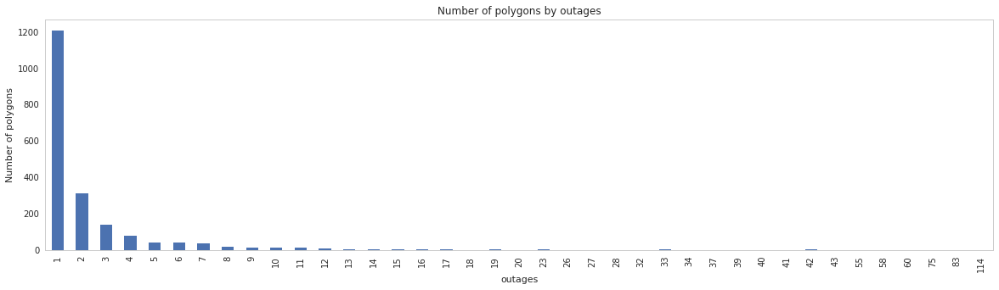

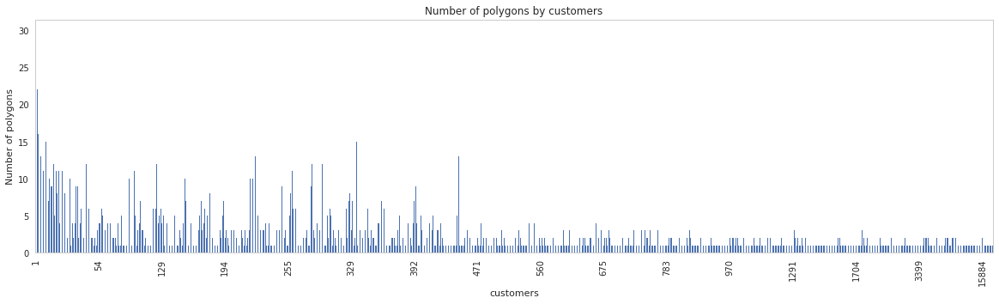

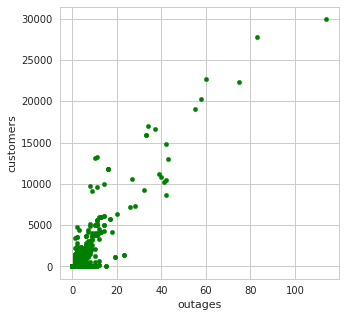

In [99]:
fig, ax = plt.subplots(figsize=(20,5))
dataset.loc[(dataset['outages'] >= 1), :].groupby(by=['outages']).count()['id'].plot(kind='bar', title='Number of polygons by outages')
plt.ylabel('Number of polygons')
plt.grid(False)

fig, ax = plt.subplots(figsize=(20,5))
dataset.loc[(dataset['customers'] >= 1), :].groupby(by=['customers']).count()['id'].plot(kind='bar', title='Number of polygons by customers')
xtick_count = 15
every_nth = len(ax.xaxis.get_ticklabels()) // xtick_count

for n, label in enumerate(ax.xaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)
plt.ylabel('Number of polygons')
plt.grid(False)

fig, ax = plt.subplots(figsize=(5,5))
dataset.plot(kind='scatter', x='outages', y='customers', ax=ax, c='green')

From above plots we can see that most of the polygons cause only 1 outage. It is notable that because reason of outages are not saved reliably, this bin may include a lot of noise. Outages are always reported from transformers. Second and third plot help us to give sense how many customers (namely houses) each outage means. 

First, if number of outages is 0, the class is 0. Rest of the dataset could be divided to classes following: 

Class 1:  1 - 2  outages  --> max ~50 customers without electricity<br>
Class 2:  3 - 10 outages  --> max ~250 customers without electricity <br>
Class 3: 11 -    outages  --> lots of customers without electricity<br>

We can also classify the data based on number of customers respectively:. 

Class 1:   1 -  50 cusomters  --> max ~2 outages<br>
Class 2:  51 - 250 customers  --> max ~10 outages <br>
Class 3: 251 -     customers  --> lots of outages<br>

In [128]:
# outages
limits = [(0,0), (1,2), (3,10), (11, 9999999)]
i = 0
for low, high in limits:
    dataset.loc[(dataset.loc[:, 'outages'] >= low) & (dataset.loc[:, 'outages'] <= high), 'class'] = i
    i += 1
    
# outages
limits = [(0,0), (1,50), (51,250), (251, 9999999)]
i = 0
for low, high in limits:
    dataset.loc[(dataset.loc[:, 'customers'] >= low) & (dataset.loc[:, 'customers'] <= high), 'class_customers'] = i
    i += 1

dataset.loc[:, ['class', 'class_customers']] = dataset.loc[:, ['class', 'class_customers']].astype(int)
dataset

,id,storm_id,point_in_time,weather_parameter,low_limit,high_limit,speed_self,angle_self,area_m2,area_diff,...,SUM Snowfall,AVG Temperature,MAX Wind gust,MIN Pressure,outages,customers,transformers,all_customers,class,class_customers
0,32276,5607-WindGust-15-999,2010-01-03 18:00:00+00:00,Pressure,0,1000,45.885378,316.657149,241096441088,15939045602,...,0,265,26,87134,0,0,16,75,0,0
14,85843,NULL,2010-10-21 14:00:00+00:00,Pressure,0,1000,6.663990,347.916194,2436625298896,67935319881,...,0,276,21,83531,0,0,13241,160548,0,0
37,84838,54789-WindGust-15-999,2010-10-15 00:00:00+00:00,Pressure,0,1000,12.006200,327.169733,2366620281872,20036629745,...,1,274,25,94320,0,0,13241,160548,0,0
0,84510,NULL,2010-10-13 00:00:00+00:00,Pressure,0,1000,3.033214,358.466487,1900868857186,-12640678489,...,0,275,21,95202,0,0,24,115,0,0
11,54789,54789-WindGust-15-999,2010-10-15 00:00:00+00:00,WindGust,15,999,-999.000000,16.372905,489915746,489915746,...,0,273,16,97665,0,0,233,3406,0,0
2,84522,NULL,2010-10-13 02:00:00+00:00,Pressure,0,1000,1.550326,333.340322,1869455169402,-4098074030,...,0,275,21,95258,0,0,18,64,0,0
30,78829,34446-WindGust-15-999,2010-09-03 06:00:00+00:00,Pressure,0,1000,21.313237,40.518348,708423069018,12149510216,...,0,284,23,96428,0,0,499,4283,0,0
3,84529,NULL,2010-10-13 03:00:00+00:00,Pressure,0,1000,7.607676,26.050411,1843938133600,-25517035802,...,0,275,20,95293,0,0,12,34,0,0
1,70680,70592-WindGust-15-999,2010-07-21 08:00:00+00:00,WindGust,15,999,-999.000000,-999.000000,224063739,224063739,...,0,297,15,99950,0,0,170,2560,0,0
0,54783,52924-WindGust-20-999,2010-10-15 00:00:00+00:00,WindGust,15,999,7.258795,318.717761,346429571503,1057325490,...,0,277,25,96922,0,0,6667,74804,0,0


In [230]:
def save_dataset(df, table_name='classification_dataset'):
    """
    Save classification dataset into the db

    df : DataFrame
         DataFrame data
    """
    if df is None or len(df) < 1:
        return
    print('Storing classification set to db sasse.{}...'.format(table_name))
    #df.set_index('id', inplace=True)
    # db_name, db_user, db_host, db_pass
    engine = create_engine('postgresql://{user}:{passwd}@{host}:5432/{db}'.format(user=db_user,
                                                                                 passwd=db_pass,
                                                                                 host=db_host,
                                                                                 db=db_name))

    index_name = 'id'
    df.to_sql(table_name, engine, schema='sasse', if_exists='append', index=False)

save_dataset(dataset)

Storing classification set to db sasse.classification_dataset...


Load ready dataset from database:

In [205]:
def load_dataset():
    all_params_w_labels = all_params + ['class', 'class_customers']
    conn = psycopg2.connect("dbname='%s' user='%s' host='%s' password='%s'" % (db_name, db_user, db_host, db_pass))
    sql = """SELECT "{}" FROM sasse.classification_dataset""".format('","'.join(all_params_w_labels))

    cursor = conn.cursor()
    cursor.execute(sql)
    results = cursor.fetchall()
    df = pd.DataFrame(results, columns=all_params_w_labels)
    df.set_index('point_in_time', inplace=True)
    return df    

In [206]:
dataset = load_dataset()

In [212]:
df = dataset.copy()
#df.set_index('point_in_time', inplace=True)

Number of different types of polygons:

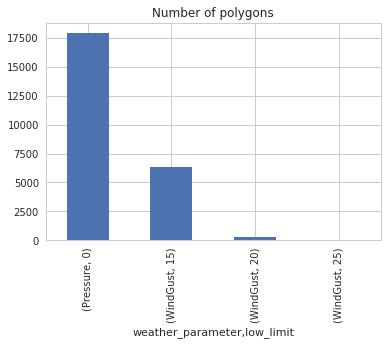

In [213]:
df.groupby(by=['weather_parameter', 'low_limit']).count()['id'].plot(kind='bar', title='Number of polygons')

In [214]:
df.groupby(by=['weather_parameter', 'low_limit']).count()['id']

weather_parameter  low_limit
Pressure           0            17880
WindGust           15            6333
                   20             336
                   25               8
Name: id, dtype: int64

Number of outages caused by the storms.

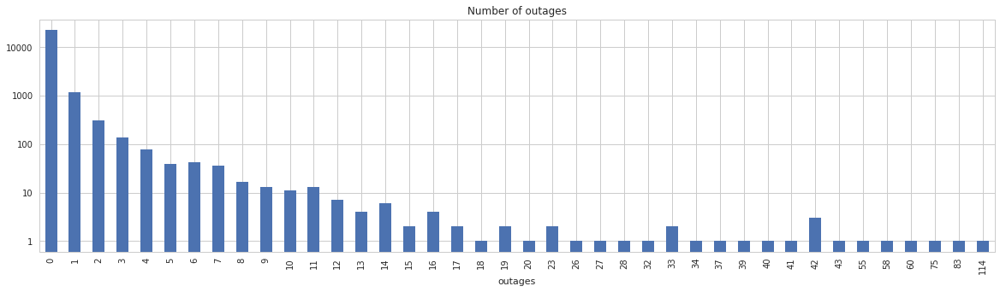

In [215]:
fig, ax = plt.subplots(figsize=(20,5))
df.groupby(by=['outages']).count()['id'].plot(kind='bar', title='Number of outages', ax=ax)
plt.yscale('log')
ax.yaxis.set_major_formatter(mticker.ScalarFormatter())
ax.yaxis.get_major_formatter().set_scientific(False)

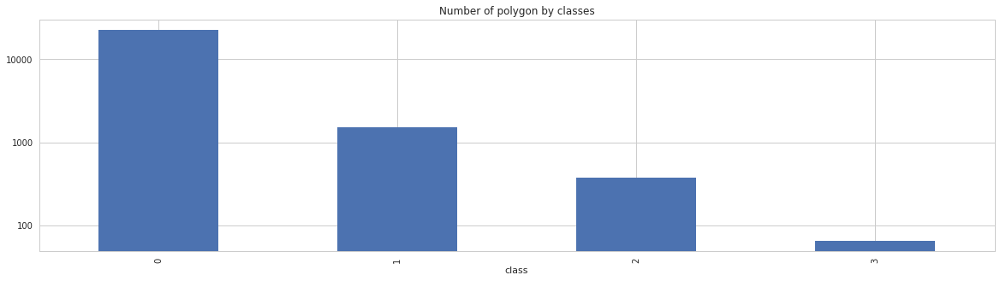

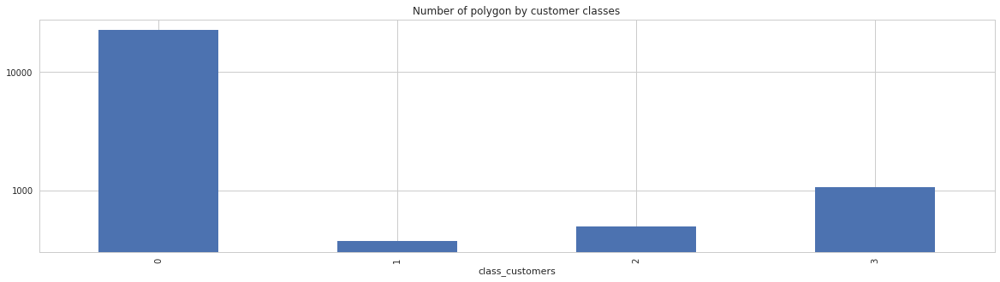

In [216]:
fig, ax = plt.subplots(figsize=(20,5))
df.groupby(by=['class']).count()['id'].plot(kind='bar', title='Number of polygon by classes', ax=ax)
plt.yscale('log')
ax.yaxis.set_major_formatter(mticker.ScalarFormatter())
ax.yaxis.get_major_formatter().set_scientific(False)

fig, ax = plt.subplots(figsize=(20,5))
df.groupby(by=['class_customers']).count()['id'].plot(kind='bar', title='Number of polygon by customer classes', ax=ax)
plt.yscale('log')
ax.yaxis.set_major_formatter(mticker.ScalarFormatter())
ax.yaxis.get_major_formatter().set_scientific(False)

In [217]:
df.groupby(by=['outages']).count()['id']

outages
0      22597
1       1207
2        311
3        139
4         79
5         40
6         42
7         36
8         17
9         13
10        11
11        13
12         7
13         4
14         6
15         2
16         4
17         2
18         1
19         2
20         1
23         2
26         1
27         1
28         1
32         1
33         2
34         1
37         1
39         1
40         1
41         1
42         3
43         1
55         1
58         1
60         1
75         1
83         1
114        1
Name: id, dtype: int64

Correlation between storm objects and number of outages. Strong correlation exists.

In [218]:
def plot_pval(corr_df, ax):

    coeffmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))
    pvalmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))

    for i in range(corr_df.shape[1]):
        for j in range(corr_df.shape[1]):        
            corrtest = pearsonr(corr_df[corr_df.columns[i]], corr_df[corr_df.columns[j]])  

            coeffmat[i,j] = corrtest[0]
            pvalmat[i,j] = corrtest[1]

    pvalmat_df = pd.DataFrame(pvalmat, columns=corr_df.columns, index=corr_df.columns)
    #fig, ax = plt.subplots(figsize=(6,6))
    sns.heatmap(pvalmat_df, cmap="YlGnBu", annot=True, ax=ax)
    
def plot_corr(df):
    s = df[(df.loc[:,'weather_parameter'] == 'Pressure')].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s2 = df[(df.loc[:,'weather_parameter'] == 'WindGust') & (df.loc[:,'low_limit'] == 15)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s3 = df[(df.loc[:,'weather_parameter'] == 'WindGust') & (df.loc[:,'low_limit'] == 20)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s4 = df[(df.loc[:,'weather_parameter'] == 'WindGust') & (df.loc[:,'low_limit'] == 25)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s5 = df.loc[:, 'outages'].groupby(by=[pd.Grouper(freq='D')]).sum()
    corr_df = pd.concat([s, s2, s3, s4, s5], axis=1, 
                        keys = ['Pressure', 'Wind Gust 15 m/s', 'Wind Gust 20 m/s', 'Wind Gust 25 m/s', 'Nro Outages'])
    corr_df.fillna(0, inplace=True)
    corr = corr_df.corr('pearson')

    fig, axes = plt.subplots(1, 2, figsize=(12,6))
    sns.heatmap(corr, cmap="YlGnBu", annot=True, ax=axes[0])
    axes[0].set_title('Correlation matrix')
    
    plot_pval(corr_df, ax=axes[1])
    axes[1].set_title('P-value test')
    plt.tight_layout()

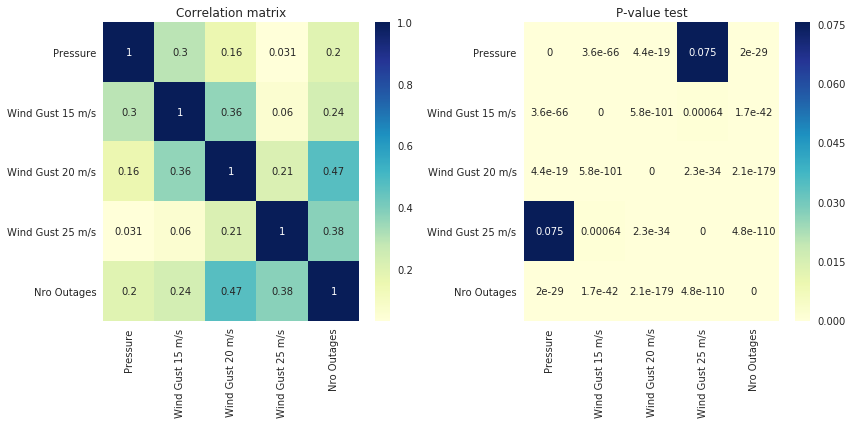

In [219]:
plot_corr(df)

Storm objects cause some outages. It can be seen from a timeseries of storm objects and outages as well.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1172: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  "will drop timezone information.", UserWarning)
/home/ec2-user/a

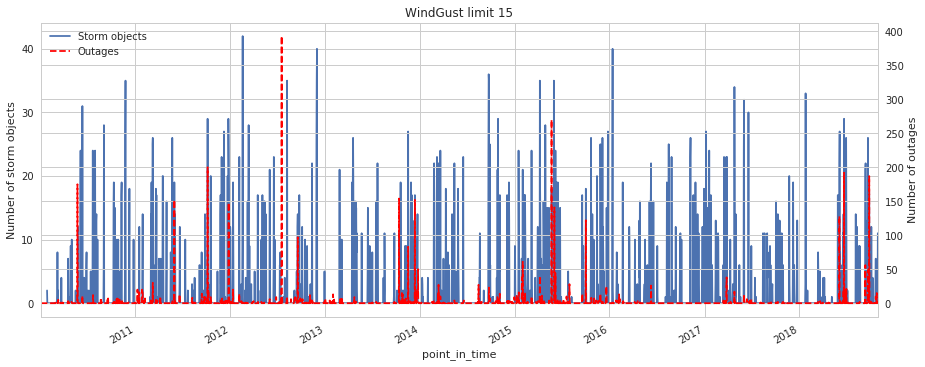

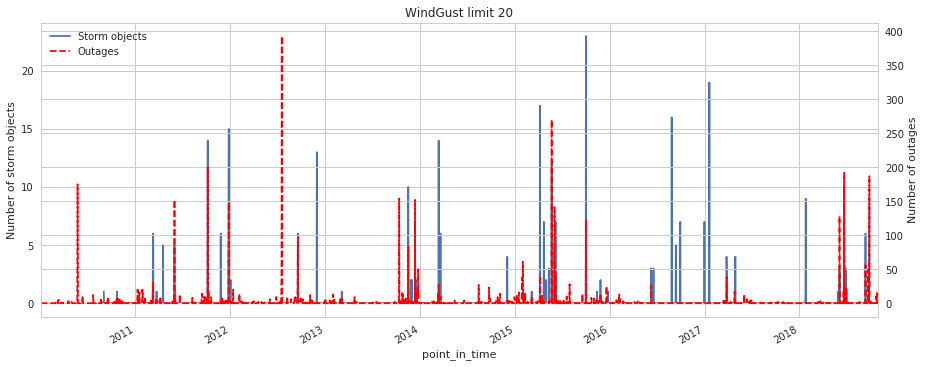

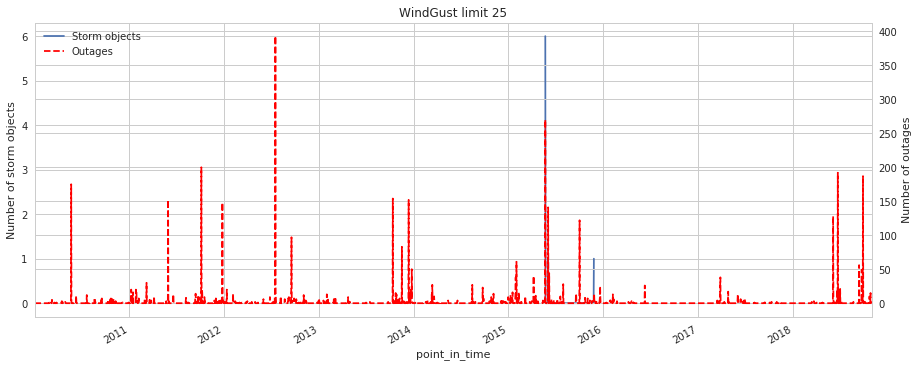

In [220]:
def plot_outages(df, parameter, limit):

    fig, ax = plt.subplots(figsize=(15,6))
    ax2 = ax.twinx()
    df[(df.loc[:,'weather_parameter'] == parameter) & (df.loc[:,'low_limit'] == limit)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count().plot(ax=ax, label='Storm objects')
    df.loc[:, 'outages'].groupby(by=[pd.Grouper(freq='D')]).sum().plot(ax=ax2, color='r', linestyle='dashed', label='Outages')
    fig.autofmt_xdate()

    ax.set_ylabel('Number of storm objects')
    ax2.set_ylabel('Number of outages')

    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax.legend(h1+h2, l1+l2, loc='upper left')            
    
    plt.title('{} limit {}'.format(parameter, limit))
    
plot_outages(df, 'WindGust', 15)
plot_outages(df, 'WindGust', 20)
plot_outages(df, 'WindGust', 25)

Correlation between outages and different weather parameters (see two last rows). Significant correlation exists with at least: speed, area, temperature, standard deviation of the wind speed, total column water vapor, mixed layer height, CAPE, Dewpoint, total cloud cover, wind gust and pressure.

At least CAPE is most probably related to convective weather. 

P-value test passes for all parameters.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


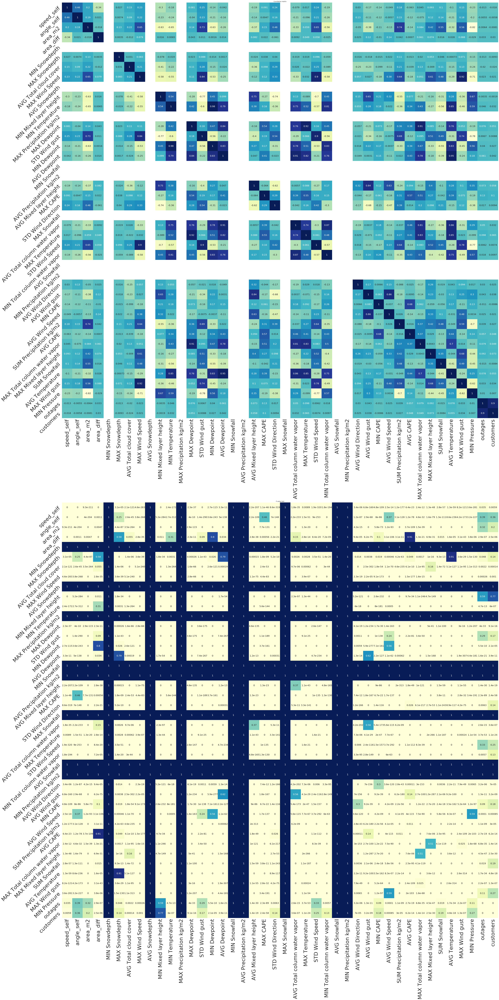

In [221]:
def plot_pval_(corr_df, ax):

    coeffmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))
    pvalmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))

    for i in range(corr_df.shape[1]):
        for j in range(corr_df.shape[1]):        
            corrtest = pearsonr(corr_df[corr_df.columns[i]], corr_df[corr_df.columns[j]])  

            coeffmat[i,j] = corrtest[0]
            pvalmat[i,j] = corrtest[1]

    pvalmat_df = pd.DataFrame(pvalmat, columns=corr_df.columns, index=corr_df.columns)
    g = sns.heatmap(pvalmat_df, cmap="YlGnBu", annot=True, ax=ax, annot_kws={"size": 20}, cbar=False)
    g.set_xticklabels(g.get_xmajorticklabels(), fontsize=45)
    g.set_yticklabels(g.get_ymajorticklabels(), fontsize=45, rotation=45)
    
df2 = df.loc[:, storm_params + outage_params].fillna(0)
corr = df2.corr('pearson')

#fig, axes = plt.subplots(1, 2, figsize=(45,30))
fig, axes = plt.subplots(2, 1, figsize=(60,120))
g = sns.heatmap(corr, cmap="YlGnBu", annot=True, ax=axes[0], annot_kws={"size": 20}, cbar=False)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize=45)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize=45, rotation=45)
axes[0].set_title('Correlation matrix')

plot_pval_(df2, ax=axes[1])
axes[1].set_title('P-value test')
plt.tight_layout()

Let's consider only winter months (from beginning of October to end of January). Now we don't have significant correlation between CAPE and outages but we do have much stronger correlation between most other parameters. Distance to pressure object and wind speed introduce also a significant correlation with outages.

P-value test do not pass for several parameter any more, however. We have much less data (826 rows).

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


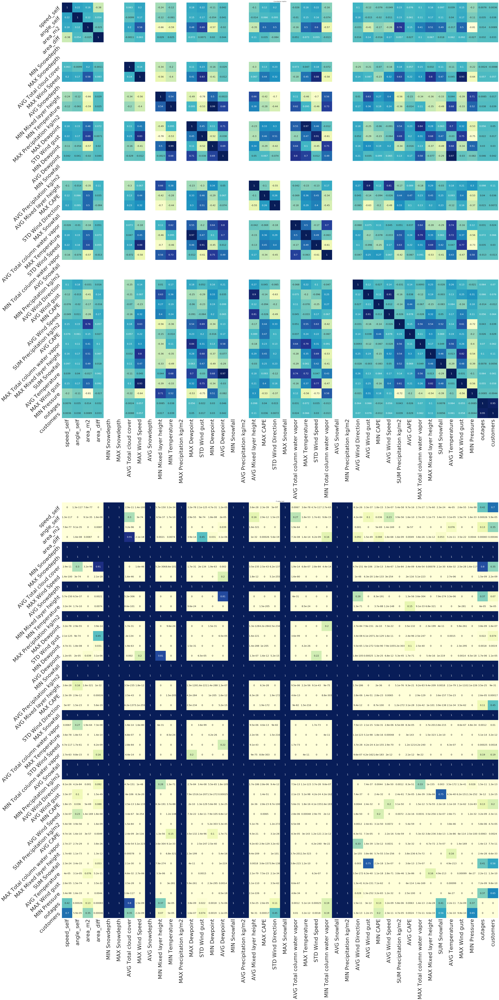

In [222]:
df3 = df.loc[(df.index.month >= 10) | (df.index.month <= 1), storm_params + outage_params].fillna(0)
corr = df3.corr('pearson')

#fig, axes = plt.subplots(1, 2, figsize=(45,30))
fig, axes = plt.subplots(2, 1, figsize=(60,120))
g = sns.heatmap(corr, cmap="YlGnBu", annot=True, ax=axes[0], annot_kws={"size": 20}, cbar=False)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize=45)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize=45, rotation=45)
axes[0].set_title('Correlation matrix')

plot_pval_(df3, ax=axes[1])
axes[1].set_title('P-value test')
plt.tight_layout()

In [223]:
df3

,speed_self,angle_self,area_m2,area_diff,MIN Snowdepth,MAX Snowdepth,AVG Total cloud cover,MAX Wind Speed,AVG Snowdepth,MIN Mixed layer height,...,SUM Precipitation kg/m2,AVG CAPE,MAX Total column water vapor,MAX Mixed layer height,SUM Snowfall,AVG Temperature,MAX Wind gust,MIN Pressure,outages,customers
point_in_time,,,,,,,,,,,,,,,,,,,,,
2010-01-03 18:00:00+00:00,45.885378,316.657149,241096441088,15939045602,0.0,0.0,1.0,19.0,0.0,12.0,...,0.0,15.0,6.0,1919.0,0.0,265.0,26.0,87134.0,0,0
2015-11-27 22:00:00+00:00,6.078201,0.972651,31675028,-230371049,0.0,0.0,1.0,7.0,0.0,859.0,...,0.0,0.0,18.0,859.0,0.0,281.0,15.0,97744.0,0,0
2015-11-25 21:00:00+00:00,35.469293,40.191461,1735472585973,-92904035307,0.0,0.0,1.0,16.0,0.0,10.0,...,1.0,4.0,13.0,1557.0,0.0,275.0,21.0,86732.0,0,0
2015-11-21 22:00:00+00:00,15.703814,321.853379,3052647924801,-69593631969,0.0,0.0,1.0,16.0,0.0,14.0,...,1.0,7.0,22.0,1850.0,1.0,272.0,23.0,95332.0,0,0
2015-11-27 12:00:00+00:00,6.033514,237.253781,2934198077095,50604445512,0.0,0.0,1.0,18.0,0.0,26.0,...,2.0,6.0,22.0,1577.0,1.0,276.0,27.0,82934.0,0,0
2015-11-26 10:00:00+00:00,16.380546,194.133716,1577212789861,24991088955,0.0,0.0,1.0,20.0,0.0,28.0,...,1.0,6.0,24.0,1759.0,0.0,275.0,28.0,86631.0,0,0
2015-11-26 06:00:00+00:00,6.589302,190.097460,1539445013269,11172733009,0.0,0.0,1.0,15.0,0.0,19.0,...,1.0,5.0,19.0,1608.0,0.0,275.0,21.0,86670.0,0,0
2015-11-27 13:00:00+00:00,4.012660,231.204280,2971332048904,37133971809,0.0,0.0,1.0,19.0,0.0,23.0,...,2.0,6.0,22.0,1624.0,1.0,276.0,28.0,82883.0,0,0
2015-11-22 04:00:00+00:00,-999.000000,32.887687,1664194863154,1664194863154,0.0,0.0,1.0,14.0,0.0,16.0,...,1.0,4.0,10.0,1254.0,0.0,270.0,19.0,95332.0,0,0


Scatter plot for outages with each parameters:

In [227]:
def scatter_outages(df):
    fig, axes = plt.subplots(14,3, figsize=(30,90))
    row, col, i = 0, 0, 0
    for p in storm_params:
        row = int(i/3)
        col = i%3
        tdf = df.loc[(df[p] != -999), ['outages', p]].astype(float)
        tdf.plot(kind='scatter', x='outages', y=p, c='g', ax=axes[row][col])
        i += 1

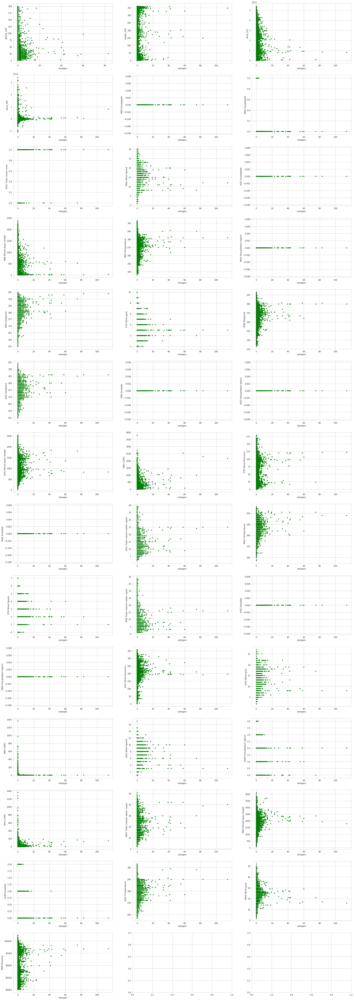

In [228]:
scatter_outages(df)

And the same for the winter months:

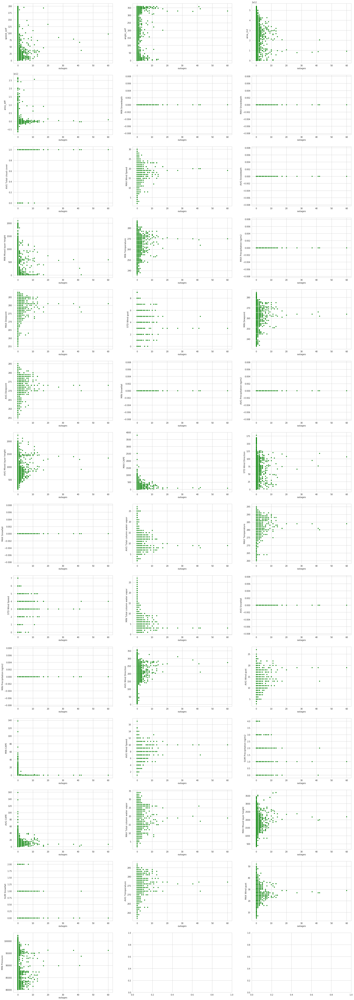

In [229]:
scatter_outages(df3)